In [153]:
import pandas as pd
import numpy as np
import yfinance as yf
import matplotlib.pyplot as plt


In [154]:
def activation(x, act='linear', deriv=False):
    if act == 'sigmoid':
       if deriv:
           out = activation(x, 'sigmoid', False)
           return out * ( 1- out)

       return 1 / (1 + np.exp(-x))
    elif act == 'relu':
        if deriv:
            return np.where(x > 0, 1, 0)
        return np.maximum(x, 0)
    elif act == 'softplus':
        if deriv:
           return activation(x, act='sigmoid')
        return np.log(1 + np.exp(x))
    elif act == 'linear':
        if deriv:
             return 1
        return x
    else:
        raise ValueError('Activation function not known.')


In [155]:
x = np.linspace(-1, 1, 20)

In [156]:
activation(x, 'sigmoid')

array([0.26894142, 0.29013328, 0.31228169, 0.33532221, 0.35917484,
       0.38374461, 0.40892261, 0.43458759, 0.46060812, 0.48684514,
       0.51315486, 0.53939188, 0.56541241, 0.59107739, 0.61625539,
       0.64082516, 0.66467779, 0.68771831, 0.70986672, 0.73105858])

In [157]:
activation(x, 'sigmoid', True)

array([0.19661193, 0.20595596, 0.21476184, 0.22288122, 0.23016827,
       0.23648468, 0.24170491, 0.24572122, 0.24844828, 0.24982695,
       0.24982695, 0.24844828, 0.24572122, 0.24170491, 0.23648468,
       0.23016827, 0.22288122, 0.21476184, 0.20595596, 0.19661193])

In [158]:
class sinn:
    def __init__(self, act='linear', lr=0.01, steps= 100,
                 verbose=False, psteps=200):
        self.act = act
        self.lr = lr
        self.steps = steps
        self.verbose = verbose
        self.psteps = psteps

    def forward(self):
        self.l2 = activation(np.dot(self.l0, self.w), self.act)
    def backward(self):

        self.e = self.l2 - self.y
        d = self.e * activation(self.l2, self.act, True)
        u = self.lr * np.dot(self.l0.T, d)
        self.w -= u
    def metrics(self, s):
        mse = (self.e ** 2).mean()
        acc = float(sum(self.l2.round() == self.y)/ len(self.y))
        self.res = self.res.append(
            pd.DataFrame({'mse': mse, 'acc': acc}, index=[s,])
        )
        if s % self.psteps == 0 and self.verbose:
                print(f'steps={s:5d} | mse={mse:.6f}')
                print(f'             | acc={acc:.6f}')


    def fit(self, l0, y, steps=None, seed=None):

        self.l0 = l0
        self.y = y
        if steps is None :
            steps = self.steps
        self.y = y
        if steps is None:
            steps = self.steps
        self.res = pd.DataFrame()
        samples, features = l0.shape
        if seed is not None :
           np.random.seed(seed)
        self.w = np.random.random((features, 1))
        for s in range(1, steps + 1):
            self.forward()
            self.backward()
            self.metrics(s)
    def predict(self, X):

        return activation(np.dot(X, self.w), self.act)


In [159]:
features = 5
samples = 5


In [160]:
np.random.seed(10)
l0 = np.random.standard_normal((samples, features))

In [161]:
l0

array([[ 1.3315865 ,  0.71527897, -1.54540029, -0.00838385,  0.62133597],
       [-0.72008556,  0.26551159,  0.10854853,  0.00429143, -0.17460021],
       [ 0.43302619,  1.20303737, -0.96506567,  1.02827408,  0.22863013],
       [ 0.44513761, -1.13660221,  0.13513688,  1.484537  , -1.07980489],
       [-1.97772828, -1.7433723 ,  0.26607016,  2.38496733,  1.12369125]])

In [162]:
np.linalg.matrix_rank(l0)

5

In [163]:
y = np.random.random((samples, 1))

In [164]:
y

array([[0.8052232 ],
       [0.52164715],
       [0.90864888],
       [0.31923609],
       [0.09045935]])

In [165]:
reg = np.linalg.lstsq(l0, y, rcond=-1)[0]

In [166]:
reg

array([[-7.49193077e-01],
       [ 1.46472991e-03],
       [-1.49864704e+00],
       [-2.49875726e-02],
       [-8.27938819e-01]])

In [167]:
np.allclose(np.dot(l0, reg), y)

True

In [168]:
model = sinn(lr=0.015, act='linear', steps=6000,
             verbose=True, psteps=1000)

In [169]:
%time model.fit(l0, y, seed=100)

<ipython-input-158-09264fd6bccb>:20: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  acc = float(sum(self.l2.round() == self.y)/ len(self.y))
<ipython-input-158-09264fd6bccb>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.res = self.res.append(
<ipython-input-158-09264fd6bccb>:20: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  acc = float(sum(self.l2.round() == self.y)/ len(self.y))
<ipython-input-158-09264fd6bccb>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat inste

steps= 1000 | mse=0.008086
             | acc=0.000000


<ipython-input-158-09264fd6bccb>:20: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  acc = float(sum(self.l2.round() == self.y)/ len(self.y))
<ipython-input-158-09264fd6bccb>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.res = self.res.append(
<ipython-input-158-09264fd6bccb>:20: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  acc = float(sum(self.l2.round() == self.y)/ len(self.y))
<ipython-input-158-09264fd6bccb>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat inste

steps= 2000 | mse=0.000545
             | acc=0.000000


<ipython-input-158-09264fd6bccb>:20: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  acc = float(sum(self.l2.round() == self.y)/ len(self.y))
<ipython-input-158-09264fd6bccb>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.res = self.res.append(
<ipython-input-158-09264fd6bccb>:20: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  acc = float(sum(self.l2.round() == self.y)/ len(self.y))
<ipython-input-158-09264fd6bccb>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat inste

steps= 3000 | mse=0.000037
             | acc=0.000000


<ipython-input-158-09264fd6bccb>:20: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  acc = float(sum(self.l2.round() == self.y)/ len(self.y))
<ipython-input-158-09264fd6bccb>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.res = self.res.append(
<ipython-input-158-09264fd6bccb>:20: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  acc = float(sum(self.l2.round() == self.y)/ len(self.y))
<ipython-input-158-09264fd6bccb>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat inste

steps= 4000 | mse=0.000002
             | acc=0.000000


<ipython-input-158-09264fd6bccb>:20: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  acc = float(sum(self.l2.round() == self.y)/ len(self.y))
<ipython-input-158-09264fd6bccb>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.res = self.res.append(
<ipython-input-158-09264fd6bccb>:20: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  acc = float(sum(self.l2.round() == self.y)/ len(self.y))
<ipython-input-158-09264fd6bccb>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat inste

steps= 5000 | mse=0.000000
             | acc=0.000000


<ipython-input-158-09264fd6bccb>:20: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  acc = float(sum(self.l2.round() == self.y)/ len(self.y))
<ipython-input-158-09264fd6bccb>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.res = self.res.append(
<ipython-input-158-09264fd6bccb>:20: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  acc = float(sum(self.l2.round() == self.y)/ len(self.y))
<ipython-input-158-09264fd6bccb>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat inste

steps= 6000 | mse=0.000000
             | acc=0.000000
CPU times: user 10.1 s, sys: 723 ms, total: 10.9 s
Wall time: 10.8 s


<ipython-input-158-09264fd6bccb>:20: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  acc = float(sum(self.l2.round() == self.y)/ len(self.y))
<ipython-input-158-09264fd6bccb>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.res = self.res.append(
<ipython-input-158-09264fd6bccb>:20: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  acc = float(sum(self.l2.round() == self.y)/ len(self.y))
<ipython-input-158-09264fd6bccb>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat inste

In [170]:
model.predict(l0)

array([[0.80512489],
       [0.52144986],
       [0.90872498],
       [0.31919803],
       [0.09045743]])

In [171]:
model.predict(l0) - y

array([[-9.83023829e-05],
       [-1.97289542e-04],
       [ 7.61035525e-05],
       [-3.80561361e-05],
       [-1.91459643e-06]])

In [172]:
l0 = np.random.randint(0, 2, (samples, features))
l0

array([[0, 1, 0, 0, 0],
       [0, 1, 0, 0, 1],
       [0, 1, 0, 0, 0],
       [1, 1, 1, 0, 0],
       [1, 0, 0, 1, 1]])

In [173]:
np.linalg.matrix_rank(l0)

4

In [174]:
y = np.random.randint(0, 2, (samples, 1))

In [175]:
y

array([[1],
       [1],
       [1],
       [0],
       [0]])

In [176]:
model = sinn(lr=0.01, act='sigmoid')

In [177]:
%time model.fit(l0, y, 4000)

Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
<ipython-input-158-09264fd6bccb>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.res = self.res.append(
<ipython-input-158-09264fd6bccb>:20: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  acc = float(sum(self.l2.round() == self.y)/ len(self.y))
<ipython-input-158-09264fd6bccb>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.res = self.res.append(
<ipython-input-158-09264fd6bccb>:20: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before

CPU times: user 7 s, sys: 475 ms, total: 7.48 s
Wall time: 7.4 s


<ipython-input-158-09264fd6bccb>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.res = self.res.append(
<ipython-input-158-09264fd6bccb>:20: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  acc = float(sum(self.l2.round() == self.y)/ len(self.y))
<ipython-input-158-09264fd6bccb>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.res = self.res.append(
<ipython-input-158-09264fd6bccb>:20: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  acc = float(sum(self.l2

In [178]:
model.l2

array([[0.91959663],
       [0.93938488],
       [0.91959663],
       [0.08729209],
       [0.02590303]])

In [179]:
model.predict(l0).round() == y

array([[ True],
       [ True],
       [ True],
       [ True],
       [ True]])

[Text(0.5, 0, 'steps'), Text(0, 0.5, 'accuracy')]

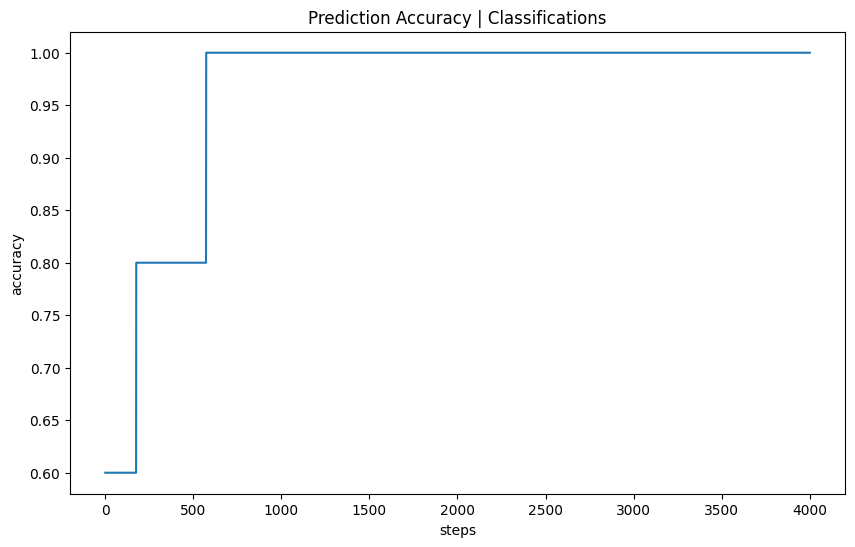

In [180]:
ax = model.res['acc'].plot(figsize=(10, 6),
             title='Prediction Accuracy | Classifications')
ax.set(xlabel="steps", ylabel='accuracy')

In [181]:
class shnn:

    def __init__(self, units=12, act='linear', lr=0.01, steps=100,
                 verbose=False, psteps=200, seed=None):
        self.units = units
        self.act = act
        self.lr = lr
        self.steps = steps
        self.verbose = verbose
        self.psteps = psteps
        self.seed = seed

    def initialize(self):

        if self.seed is not None:
            np.random.seed(self.seed)
        samples, features = self.l0.shape
        self.w0 = np.random.random((features, self.units))
        self.w1 = np.random.random((self.units, 1))

    def forward(self):
        self.l1 = activation(np.dot(self.l0, self.w0), self.act)
        self.l2 = activation(np.dot(self.l1, self.w1), self.act)

    def backward(self):
        self.e = self.l2 - self.y
        d2 = self.e * activation(self.l2, self.act, True)
        u2 = self.lr * np.dot(self.l1.T, d2)
        self.w1 -= u2
        e1 = np.dot(d2, self.w1.T)
        d1 = e1 * activation(self.l1, self.act, True)
        u1 = self.lr * np.dot(self.l0.T, d1)
        self.w0 -= u1
    def metrics(self, s):

        mse = (self.e ** 2).mean()
        acc = float(sum(self.l2.round() == self.y) / len(self.y))
        self.res = self.res.append(
            pd.DataFrame({'mse': mse, 'acc': acc}, index=[s,])
        )
        if s % self.psteps == 0 and self.verbose:
                print(f'step={s:5d} | mse={mse:.5f}')
                print(f'            | acc={acc:.5f}')

    def fit(self, l0, y, steps=None):

        self.l0 = l0
        self.y = y
        if steps is None :
            steps = self.steps
        self.res = pd.DataFrame()
        self.initialize()
        self.forward()
        for s in range(1, steps + 1):
            self.backward()
            self.forward()
            self.metrics(s)
    def predict(self, X):
        l1 = activation(np.dot(X, self.w0), self.act)
        l2 = activation(np.dot(l1, self.w1), self.act)
        return l2

In [182]:
features = 5
samples = 5

In [183]:
l0 = np.random.standard_normal((samples, features))

In [184]:
np.linalg.matrix_rank(l0)

5

In [185]:
reg = np.random.random((samples, 1))

In [186]:
reg = np.linalg.lstsq(l0, y, rcond=-1)[0]

In [187]:
reg

array([[ 2.58941364],
       [-0.39751108],
       [ 0.08788976],
       [-0.33102569],
       [ 1.55507391]])

In [188]:
(np.dot(l0, reg) -y)

array([[ 4.88498131e-15],
       [-1.66533454e-15],
       [-5.44009282e-15],
       [ 3.72900459e-16],
       [-2.20664827e-15]])

In [189]:
((np.dot(l0, reg) - y) **2 ).mean()

1.224786855194658e-29

In [190]:
model = shnn(lr=0.01, units=16, act='softplus',
             verbose=True, psteps=2000, seed=100)

In [191]:
%time model.fit(l0, y, 8000)

Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
<ipython-input-181-5a5b347847cf>:37: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  acc = float(sum(self.l2.round() == self.y) / len(self.y))
<ipython-input-181-5a5b347847cf>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.res = self.res.append(
<ipython-input-181-5a5b347847cf>:37: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  acc = float(sum(self.l2.round() == self.y) / len(self.y))
<ipython-input-181-5a5b347847cf>:38: FutureWarning: The frame.append method is depreca

step= 2000 | mse=0.00001
            | acc=1.00000


Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
<ipython-input-181-5a5b347847cf>:37: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  acc = float(sum(self.l2.round() == self.y) / len(self.y))
<ipython-input-181-5a5b347847cf>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.res = self.res.append(
<ipython-input-181-5a5b347847cf>:37: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  acc = float(sum(self.l2.round() == self.y) / len(self.y))
<ipython-input-181-5a5b347847cf>:38: FutureWarning: The frame.append method is depreca

step= 4000 | mse=0.00000
            | acc=1.00000


Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
<ipython-input-181-5a5b347847cf>:37: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  acc = float(sum(self.l2.round() == self.y) / len(self.y))
<ipython-input-181-5a5b347847cf>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.res = self.res.append(
<ipython-input-181-5a5b347847cf>:37: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  acc = float(sum(self.l2.round() == self.y) / len(self.y))
<ipython-input-181-5a5b347847cf>:38: FutureWarning: The frame.append method is depreca

step= 6000 | mse=0.00000
            | acc=1.00000


Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
<ipython-input-181-5a5b347847cf>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.res = self.res.append(
<ipython-input-181-5a5b347847cf>:37: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  acc = float(sum(self.l2.round() == self.y) / len(self.y))
<ipython-input-181-5a5b347847cf>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.res = self.res.append(
<ipython-input-181-5a5b347847cf>:37: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array befor

step= 8000 | mse=0.00000
            | acc=1.00000
CPU times: user 16.7 s, sys: 854 ms, total: 17.5 s
Wall time: 17.9 s


<ipython-input-181-5a5b347847cf>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.res = self.res.append(
<ipython-input-181-5a5b347847cf>:37: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  acc = float(sum(self.l2.round() == self.y) / len(self.y))
<ipython-input-181-5a5b347847cf>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.res = self.res.append(
<ipython-input-181-5a5b347847cf>:37: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  acc = float(sum(self.l

In [192]:
model.l2 - y

array([[-2.02891472e-05],
       [-4.05456787e-04],
       [ 1.36565356e-04],
       [ 5.72734787e-04],
       [ 6.84632253e-04]])

In [193]:
model = shnn(lr=0.025, act='sigmoid', steps=200,
              verbose=True, psteps=50, seed=100)

In [194]:
l0.round()

array([[ 1., -1.,  0., -0., -1.],
       [ 0., -0., -0.,  2.,  0.],
       [ 1.,  2.,  2.,  0., -1.],
       [-1., -0.,  1., -2.,  1.],
       [-1., -1., -2.,  0.,  2.]])

In [195]:
np.linalg.matrix_rank(l0)

5

In [196]:
y.round()

array([[1],
       [1],
       [1],
       [0],
       [0]])

In [197]:
model.fit(l0.round(), y.round())

<ipython-input-181-5a5b347847cf>:37: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  acc = float(sum(self.l2.round() == self.y) / len(self.y))
<ipython-input-181-5a5b347847cf>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.res = self.res.append(
<ipython-input-181-5a5b347847cf>:37: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  acc = float(sum(self.l2.round() == self.y) / len(self.y))
<ipython-input-181-5a5b347847cf>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat ins

step=   50 | mse=0.25487
            | acc=0.60000
step=  100 | mse=0.19635
            | acc=0.60000
step=  150 | mse=0.15747
            | acc=0.60000
step=  200 | mse=0.12902
            | acc=0.60000


<ipython-input-181-5a5b347847cf>:37: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  acc = float(sum(self.l2.round() == self.y) / len(self.y))
<ipython-input-181-5a5b347847cf>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.res = self.res.append(
<ipython-input-181-5a5b347847cf>:37: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  acc = float(sum(self.l2.round() == self.y) / len(self.y))
<ipython-input-181-5a5b347847cf>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat ins

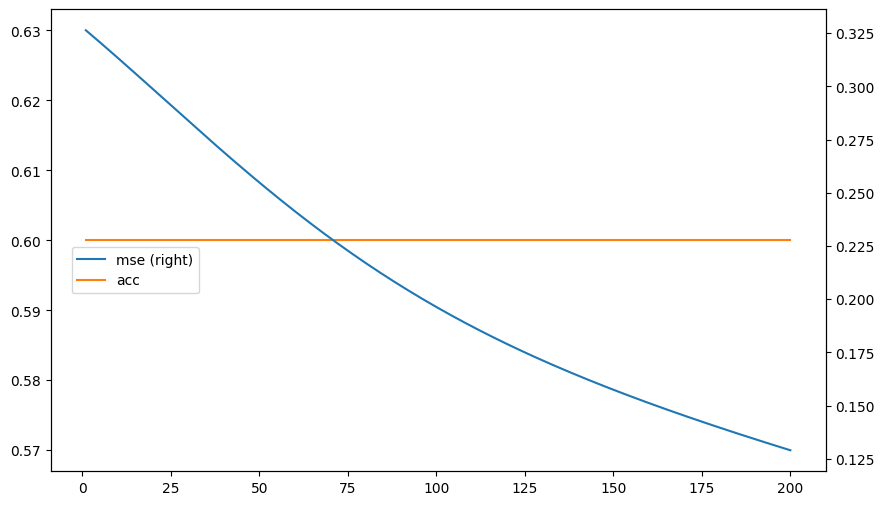

In [198]:
ax = model.res.plot(figsize=(10, 6), secondary_y='mse')
ax.get_legend().set_bbox_to_anchor((0.2, 0.5));

In [199]:
Ticker = 'TSLA'
start = '2023-12-31'
end ='2024-03-31'
data = yf.download(Ticker, start, end)['Adj Close']

[*********************100%%**********************]  1 of 1 completed


In [200]:
data

Date
2024-01-02    248.419998
2024-01-03    238.449997
2024-01-04    237.929993
2024-01-05    237.490005
2024-01-08    240.449997
2024-01-09    234.960007
2024-01-10    233.940002
2024-01-11    227.220001
2024-01-12    218.889999
2024-01-16    219.910004
2024-01-17    215.550003
2024-01-18    211.880005
2024-01-19    212.190002
2024-01-22    208.800003
2024-01-23    209.139999
2024-01-24    207.830002
2024-01-25    182.630005
2024-01-26    183.250000
2024-01-29    190.929993
2024-01-30    191.589996
2024-01-31    187.289993
2024-02-01    188.860001
2024-02-02    187.910004
2024-02-05    181.059998
2024-02-06    185.100006
2024-02-07    187.580002
2024-02-08    189.559998
2024-02-09    193.570007
2024-02-12    188.130005
2024-02-13    184.020004
2024-02-14    188.710007
2024-02-15    200.449997
2024-02-16    199.949997
2024-02-20    193.759995
2024-02-21    194.770004
2024-02-22    197.410004
2024-02-23    191.970001
2024-02-26    199.399994
2024-02-27    199.729996
2024-02-28    202.03

In [201]:
data = pd.DataFrame(data)

In [202]:
lags = 5
cols = []
data['r'] = np.log(data/data.shift(1))
data['d'] = np.where(data['r'] > 0, 1, 0)
for lag in range(1, lags + 1):
    col = f'lag_{lag}'
    data[col] = data['r'].shift(lag)
    cols.append(col)
data.dropna(inplace=True)
data[cols] = (data[cols] - data[cols].mean()) / data[cols].std()

In [203]:
data.head()

,Adj Close,r,d,lag_1,lag_2,lag_3,lag_4,lag_5
Date,,,,,,,,
2024-01-10,233.940002,-0.004351,0,-0.602898,0.545802,0.083560,0.085100,-1.123588
2024-01-11,227.220001,-0.029146,0,0.008916,-0.608558,0.546785,0.095949,0.120558
2024-01-12,218.889999,-0.037349,0,-0.800321,0.001300,-0.607685,0.560911,0.131217
2024-01-16,219.910004,0.004649,1,-1.068054,-0.805350,0.002231,-0.597886,0.588011
2024-01-17,215.550003,-0.020025,0,0.302636,-1.072227,-0.804497,0.014316,-0.550431


In [204]:
model = shnn(lr=0.0001, act='sigmoid', steps=10000,
             verbose=True, psteps=2000, seed=100)

In [205]:
y = data['d'].values.reshape(-1, 1)

In [206]:
%time model.fit(data[cols].values, y)

Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
<ipython-input-181-5a5b347847cf>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.res = self.res.append(
<ipython-input-181-5a5b347847cf>:37: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  acc = float(sum(self.l2.round() == self.y) / len(self.y))
<ipython-input-181-5a5b347847cf>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.res = self.res.append(
<ipython-input-181-5a5b347847cf>:37: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array befor

step= 2000 | mse=0.31176
            | acc=0.51351


Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
<ipython-input-181-5a5b347847cf>:37: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  acc = float(sum(self.l2.round() == self.y) / len(self.y))
<ipython-input-181-5a5b347847cf>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.res = self.res.append(
<ipython-input-181-5a5b347847cf>:37: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  acc = float(sum(self.l2.round() == self.y) / len(self.y))
<ipython-input-181-5a5b347847cf>:38: FutureWarning: The frame.append method is depreca

step= 4000 | mse=0.24760
            | acc=0.54054


Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
<ipython-input-181-5a5b347847cf>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.res = self.res.append(
<ipython-input-181-5a5b347847cf>:37: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  acc = float(sum(self.l2.round() == self.y) / len(self.y))
<ipython-input-181-5a5b347847cf>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.res = self.res.append(
<ipython-input-181-5a5b347847cf>:37: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array befor

step= 6000 | mse=0.24152
            | acc=0.51351


Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
<ipython-input-181-5a5b347847cf>:37: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  acc = float(sum(self.l2.round() == self.y) / len(self.y))
<ipython-input-181-5a5b347847cf>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.res = self.res.append(
<ipython-input-181-5a5b347847cf>:37: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  acc = float(sum(self.l2.round() == self.y) / len(self.y))
<ipython-input-181-5a5b347847cf>:38: FutureWarning: The frame.append method is depreca

step= 8000 | mse=0.24036
            | acc=0.56757


Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
<ipython-input-181-5a5b347847cf>:37: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  acc = float(sum(self.l2.round() == self.y) / len(self.y))
<ipython-input-181-5a5b347847cf>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.res = self.res.append(
<ipython-input-181-5a5b347847cf>:37: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  acc = float(sum(self.l2.round() == self.y) / len(self.y))
<ipython-input-181-5a5b347847cf>:38: FutureWarning: The frame.append method is depreca

step=10000 | mse=0.23946
            | acc=0.59459
CPU times: user 19.1 s, sys: 1.01 s, total: 20.1 s
Wall time: 20.4 s


<ipython-input-181-5a5b347847cf>:37: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  acc = float(sum(self.l2.round() == self.y) / len(self.y))
<ipython-input-181-5a5b347847cf>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.res = self.res.append(
<ipython-input-181-5a5b347847cf>:37: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  acc = float(sum(self.l2.round() == self.y) / len(self.y))
<ipython-input-181-5a5b347847cf>:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat ins

In [207]:
data['p'] = np.where(model.predict(data[cols]) > 0.5, 1, -1)

In [208]:
data['p'].value_counts()

-1    23
 1    14
Name: p, dtype: int64

In [209]:
data['s'] = data['p'] * data['r']

In [210]:
data[['r', 's']].sum().apply(np.exp)

r    0.800732
s    1.292389
dtype: float64

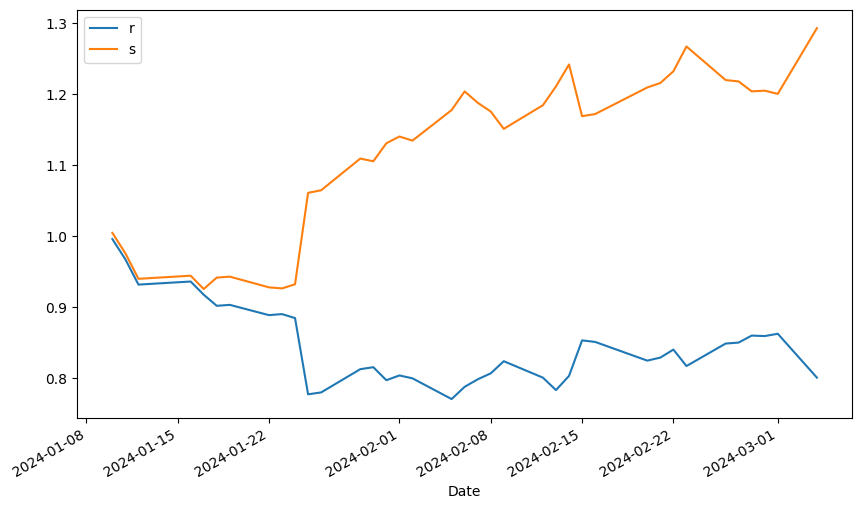

In [211]:
data[['r', 's']].cumsum().apply(np.exp).plot(figsize=(10, 6));

In [213]:
data.tail()

,Adj Close,r,d,lag_1,lag_2,lag_3,lag_4,lag_5,p,s
Date,,,,,,,,,,
2024-02-27,199.729996,0.001654,1,1.390241,-0.766237,0.581819,0.326187,-0.818338,-1,-0.001654
2024-02-28,202.039993,0.011499,1,0.204874,1.378210,-0.765380,0.596076,0.357410,-1,-0.011499
2024-02-29,201.880005,-0.000792,0,0.526202,0.196632,1.379274,-0.756171,0.622558,-1,0.000792
2024-03-01,202.639999,0.003758,1,0.125052,0.516933,0.197582,1.396519,-0.705936,-1,-0.003758
2024-03-04,188.139999,-0.074245,0,0.273539,0.117065,0.517914,0.210399,1.408941,-1,0.074245
